# Toy model mixing: figure generation

## Alexandra Semposki

### Date: 11 January 2022

In [1]:
#import packages
import numpy as np
import statistics
from scipy import stats, special, integrate
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

matplotlib.rcParams.update({
   'font.family': 'serif',
   'text.usetex': True,
})

#import classes we'll need
from mixing import Switching, Mixing, Models
from discrepancy import Discrepancy
from gaussprocess import GP
from priors import Priors

## Expansion plots

Welcome to the BMM sandbox! Here you get to play!
Select a dpi for the figure.600

y-limits (enter "auto" if unknown): 1.0,3.0


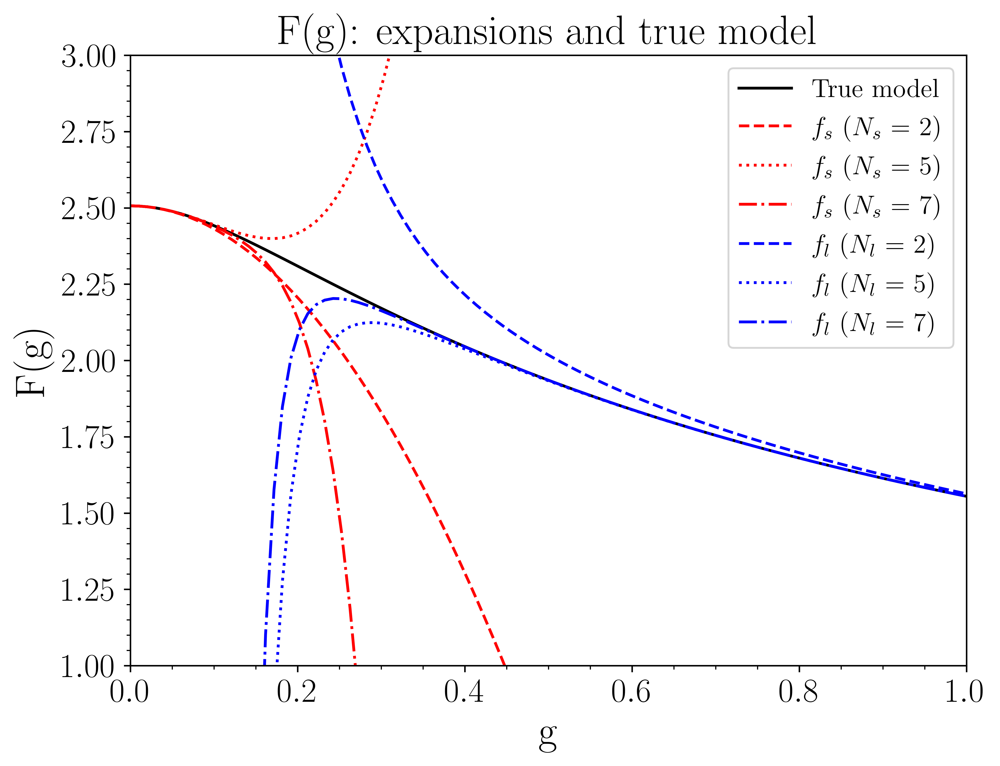

Would you like to save this figure? (yes/no)yes
Enter a file name (include .jpg, .png, etc.)multiple_orders_lower.png


In [11]:
#set up some arrays
g0 = np.linspace(1e-6, 1.0, 100)
low0 = np.array([2,5,7])
high0 = np.array([2,5,7])

#set up a class
zero = Mixing()

#call the function to plot several models
zero.plot_models(g0, low0, high0)

## Linear mixture model

In [3]:
#import more needed things for LMM
import emcee
import corner

### 2 and 2

Prior information needed to reproduce plot in the paper:

#g1 truncated between (0, 0.35)
g1 = self.luniform(params[0], 0.1, 0.9) + stats.norm.logpdf(params[0], 0.10, 0.1)

#g3 truncated between (g1, 0.35)
g3 = self.luniform(params[2], params[0], 0.9) + stats.norm.logpdf(params[2], 0.40, 0.1)

#g2 truncated between (g3, 0.35)
g2 = self.luniform(params[1], params[2], 0.9) + stats.norm.logpdf(params[1], 0.70, 0.1)

In [4]:
#set up the arrays
g1 = np.linspace(1e-6, 1.0, 200)
low1 = np.array([2])
high1 = np.array([2])

#set up the class
one = Mixing()

Welcome to the BMM sandbox! Here you get to play!


Set a dpi for the figure.600

y-limits (enter "auto" if unknown): 1.0,3.0


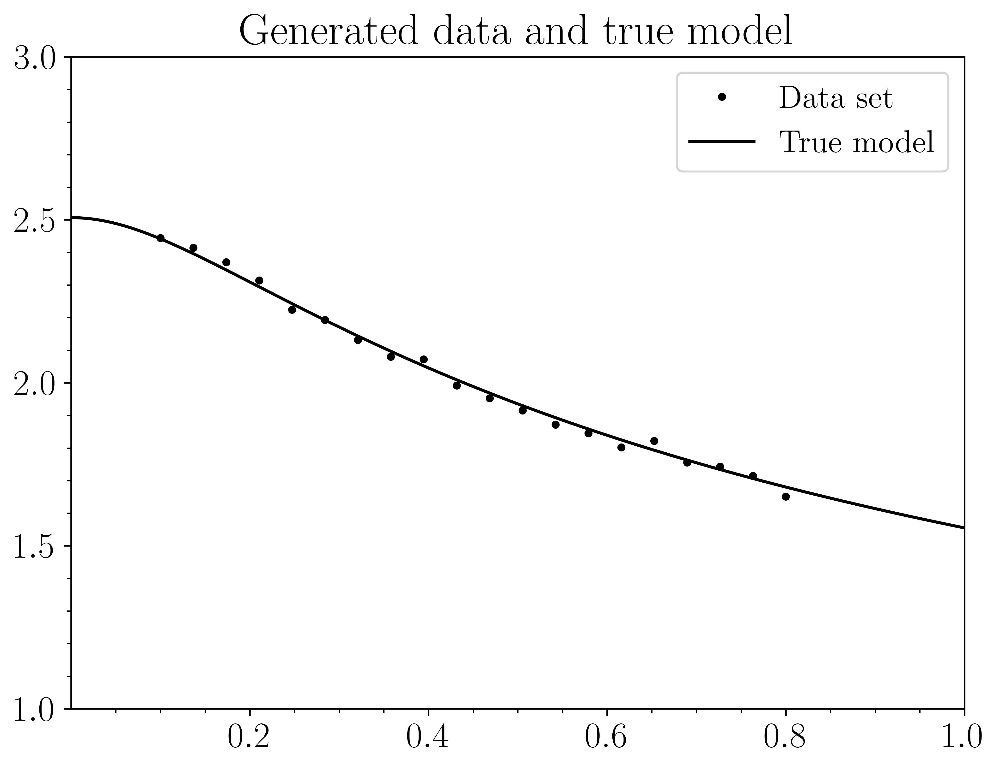

Would you like to save this figure? (yes/no)no


In [5]:
#set up data generation and seed
g_data1 = np.linspace(0.1, 0.8, 20)

#seeded arrays
data = np.array([2.44439472, 2.41427674, 2.36965401, 2.31426241, 2.22442011,
        2.19238095, 2.1314909 , 2.08041477, 2.07206492, 1.99156748,
        1.95301115, 1.91505115, 1.87176334, 1.84524891, 1.8018448 ,
        1.82176999, 1.7555685 , 1.74282668, 1.71428479, 1.65072084])
sigma = np.array([0.02444395, 0.02414277, 0.02369654, 0.02314262, 0.0222442 ,
        0.02192381, 0.02131491, 0.02080415, 0.02072065, 0.01991567,
        0.01953011, 0.01915051, 0.01871763, 0.01845249, 0.01801845,
        0.0182177 , 0.01755569, 0.01742827, 0.01714285, 0.01650721])

data, sigma = one.add_data(g1, g_data1, data, sigma)

In [6]:
#call the function for LMM sampling
chainr, trace = one.mixed_model(g_data1, data, sigma, low1, high1)

What switching function would you like to use: logistic, cdf, or cosine?cosine
Enter the number of steps per walker.3000
Using 20 walkers with 3000 steps each, for a total of 60000 samples.
[[0.14688523 0.27619462 0.21792935]
 [0.15182448 0.25617024 0.20690576]
 [0.13698467 0.2888823  0.20740827]
 [0.17025332 0.26484114 0.2356957 ]
 [0.13491097 0.28177046 0.20108935]
 [0.17952404 0.2952116  0.22341721]
 [0.17626342 0.27420691 0.23396071]
 [0.12558024 0.2771199  0.19810014]
 [0.145662   0.27665913 0.19530254]
 [0.13994302 0.27264251 0.22241078]
 [0.14805234 0.26174952 0.22561683]
 [0.14074605 0.25920251 0.2336659 ]
 [0.14185406 0.26356352 0.20439164]
 [0.12370096 0.27269111 0.22373459]
 [0.17259698 0.29891324 0.23554633]
 [0.15222487 0.26038185 0.23508777]
 [0.12679402 0.2906187  0.20796389]
 [0.14454536 0.27192758 0.19357724]
 [0.17133841 0.29458482 0.23729491]
 [0.13908186 0.27824931 0.21596326]] (20, 3)
Calculation finished!
Duration = 2 min, 1 sec.
How many burn-in samples per walke

The autocorrelation information is: p = [ 26.39798125 -27.14077971]; cov = [[ 0.00944799 -0.01132441]
 [-0.01132441  0.01368535]]
The autocorrelation information is: p = [ 23.82029166 -26.02420118]; cov = [[ 0.0110942  -0.01421652]
 [-0.01421652  0.01837886]]
The autocorrelation information is: p = [ 21.03074632 -24.42930724]; cov = [[ 0.00491142 -0.00675602]
 [-0.00675602  0.00938499]]
The autocorrelation time is: 26.39798124634252
The autocorrelation time is: 23.82029166433409
The autocorrelation time is: 21.030746317728266
(3, 2308)
Set a dpi for the figure.600
Do you want to display the median with the mean? (yes/no)yes


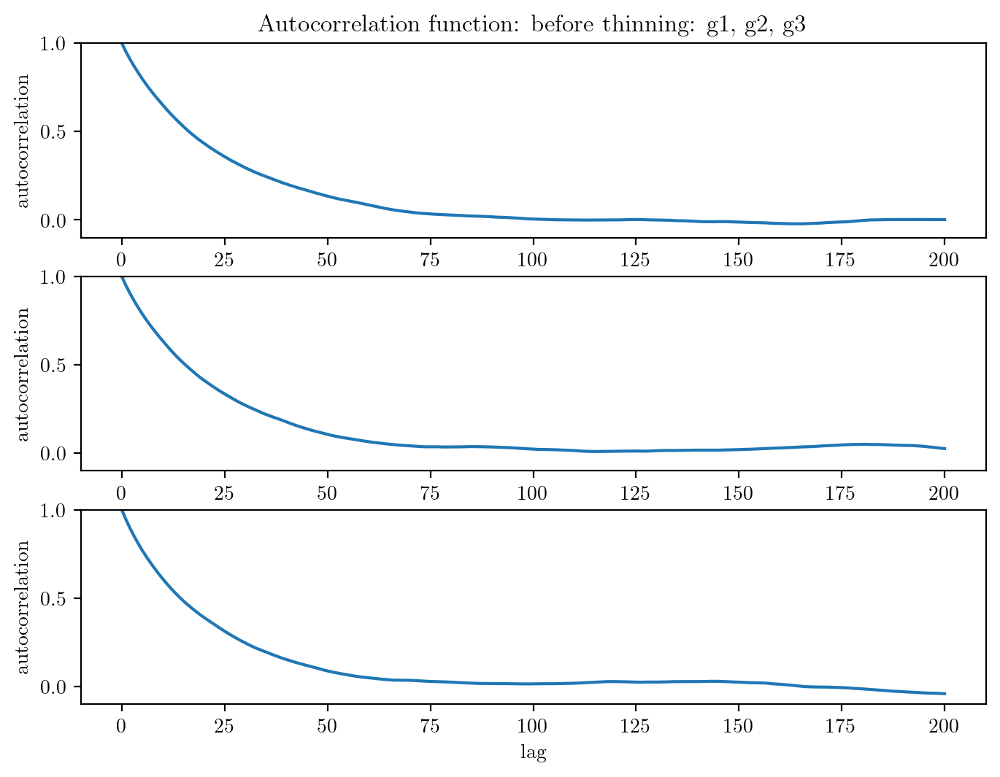

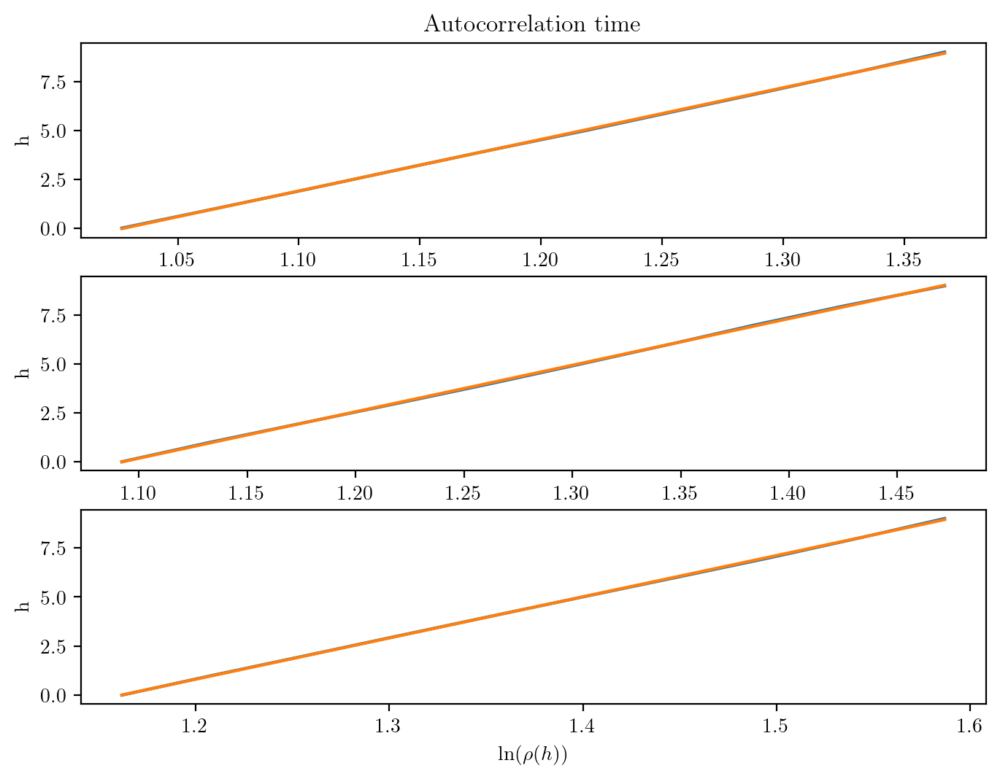

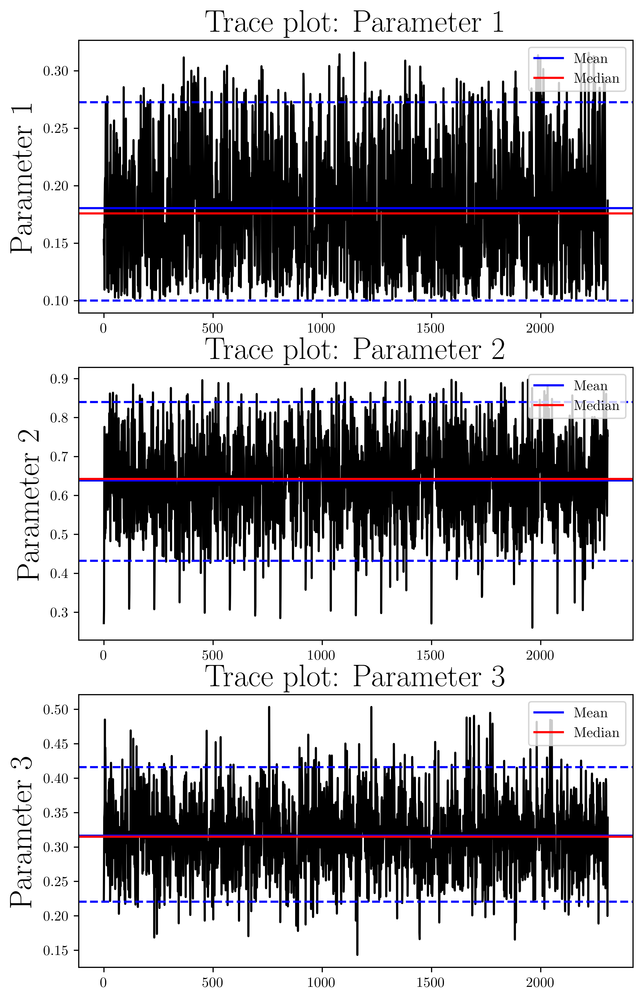

Would you like to save this figure? (yes/no)yes
Enter a file name (include .jpg, .png, etc.)no.png
The median values are: 1 = 0.1758833084575681; 2 = 0.6423805242667922; 3 = 0.3150784642905221
The mean values are: 1 = 0.18058039036670012; 2 = 0.6385537158653056; 3 = 0.3164119761499101


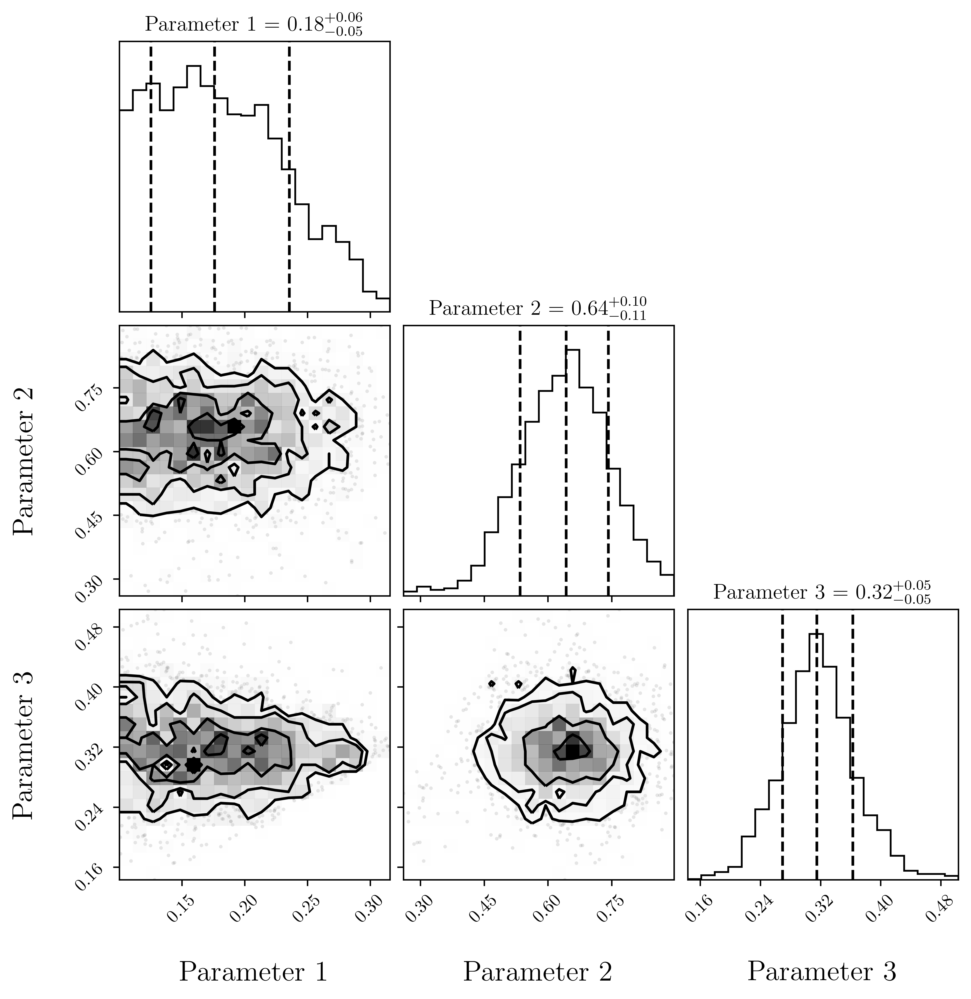

In [7]:
import statistics

#find autocorrelation time and thin burn-in
def autocorrelation(chain, max_lag=100):
    dimension = len(chain)
    acors = np.empty(max_lag+1)
    if max_lag > len(chain)/5:
        warnings.warn('max_lag is more than one fifth the chain length')
    # Create a copy of the chain with average zero
    chain1d = chain - np.average(chain)
    for lag in range(max_lag+1):
        unshifted = None
        shifted = chain1d[lag:]
        if 0 == lag:
            unshifted = chain1d
        else:
            unshifted = chain1d[:-lag]
        normalization = np.sqrt(np.dot(unshifted, unshifted))
        normalization *= np.sqrt(np.dot(shifted, shifted))
        acors[lag] = np.dot(unshifted, shifted) / normalization
    return acors

#make an array of the chain results for each parameter
chain_result = chainr.chain[:,:,:]

chain1 = chain_result[:,:,0]
chain2 = chain_result[:,:,1]
chain3 = chain_result[:,:,2]

#flatten into a 1d arrays
flat1 = chain1.flatten()
flat2 = chain2.flatten()
flat3 = chain3.flatten()

#determine autocorrelation of each parameter chain
post_acors1 = autocorrelation(flat1, max_lag=200)
post_acors2 = autocorrelation(flat2, max_lag=200)
post_acors3 = autocorrelation(flat3, max_lag=200)

fig, ax = plt.subplots(3,1, figsize=(8,6), dpi=200)
ax[0].plot(post_acors1)
ax[1].plot(post_acors2)
ax[2].plot(post_acors3)
for i in range(3):
    ax[i].set(xlabel='lag', ylabel='autocorrelation', ylim=(-.1, 1));
ax[0].set_title(f'Autocorrelation function: before thinning: g1, g2, g3')

#determine the autocorrelation time
post_rho1 = post_acors1[25:35]
post_rho2 = post_acors2[25:35]
post_rho3 = post_acors3[25:35]

fig,ax = plt.subplots(3,1, figsize=(8,6), dpi=200)
post_y = np.arange(10)
post_x1 = -np.log(post_rho1)
post_x2 = -np.log(post_rho2)
post_x3 = -np.log(post_rho3)
        
ax[2].set_xlabel(r'ln($\rho(h)$)')
for i in range(3):
    ax[i].set_ylabel('h')
ax[0].set_title('Autocorrelation time')
ax[0].plot(post_x1, post_y)
ax[1].plot(post_x2, post_y)
ax[2].plot(post_x3, post_y)

#linear fits
p1, cov1 = np.polyfit(post_x1, post_y, 1, cov = True)
p2, cov2 = np.polyfit(post_x2, post_y, 1, cov=True)
p3, cov3 = np.polyfit(post_x3, post_y, 1, cov=True)

print('The autocorrelation information is: p = {}; cov = {}'.format(p1, cov1))
print('The autocorrelation information is: p = {}; cov = {}'.format(p2, cov2))
print('The autocorrelation information is: p = {}; cov = {}'.format(p3, cov3))

print('The autocorrelation time is: {}'.format(p1[0]))
print('The autocorrelation time is: {}'.format(p2[0]))
print('The autocorrelation time is: {}'.format(p3[0]))

ax[0].plot(post_x1, p1[0]*post_x1 + p1[1])
ax[1].plot(post_x2, p2[0]*post_x2 + p2[1])
ax[2].plot(post_x3, p3[0]*post_x3 + p3[1])

#adjust the samples by thinning according to the autocorrelation time
thin1 = []
thin2 = []
thin3 = []

#get the autocorrelation time we use for all 3 parameters
if p1[0] > p2[0]:
    time = p1[0]
else:
    time = p2[0]
    if p3[0] > time:
        time = p3[0]
time = int(time)
        
for i in range(len(flat2)):
    if i % time == 0:
        thin1.append(flat1[i])
        thin2.append(flat2[i])
        thin3.append(flat3[i])
                    
#array thinned samples
thin1 = np.array(thin1)
thin2 = np.array(thin2)
thin3 = np.array(thin3)

#stack traces back together
thin = np.vstack((thin1, thin2, thin3))

#reposition (transpose)
print(np.shape(thin))

one.stats_trace(thin, 3)

#median calculation
median_1 = statistics.median(thin[0,:])
median_2 = statistics.median(thin[1,:])
median_3 = statistics.median(thin[2,:])

#mean calculation
mean_1 = np.mean(thin[0,:])
mean_2 = np.mean(thin[1,:])
mean_3 = np.mean(thin[2,:])

#arrays
mean_results = np.array([mean_1, mean_2, mean_3])
median_results = np.array([median_1, median_2, median_3])

print('The median values are: 1 = {}; 2 = {}; 3 = {}'.format(median_1, median_2, median_3))
print('The mean values are: 1 = {}; 2 = {}; 3 = {}'.format(mean_1, mean_2, mean_3))

In [8]:
g_ppd = np.linspace(1e-6, 1.0, 200)

switch_results_ppd = one.ppd(thin, g_ppd, low1, high1)

switch_med_results = np.empty([len(g_ppd)])
switch_mode_results = np.empty([len(g_ppd)])
switch_g_intervals = np.empty([len(g_ppd), 2])

for i in range(len(g_ppd)):
    switch_med_results[i] = statistics.median(switch_results_ppd[i,:])
    switch_mode_results[i] = np.max(switch_results_ppd[i,:])
    switch_g_intervals[i, :] = one.credible_intervals(switch_results_ppd[i,:], 0.68)

Set a dpi for the figure.600
Enter the minimum g to plot.0.0
Enter the maximum g to plot.1.0
Enter the minimum for F(g).1.0
Enter the maximum for F(g).3.0


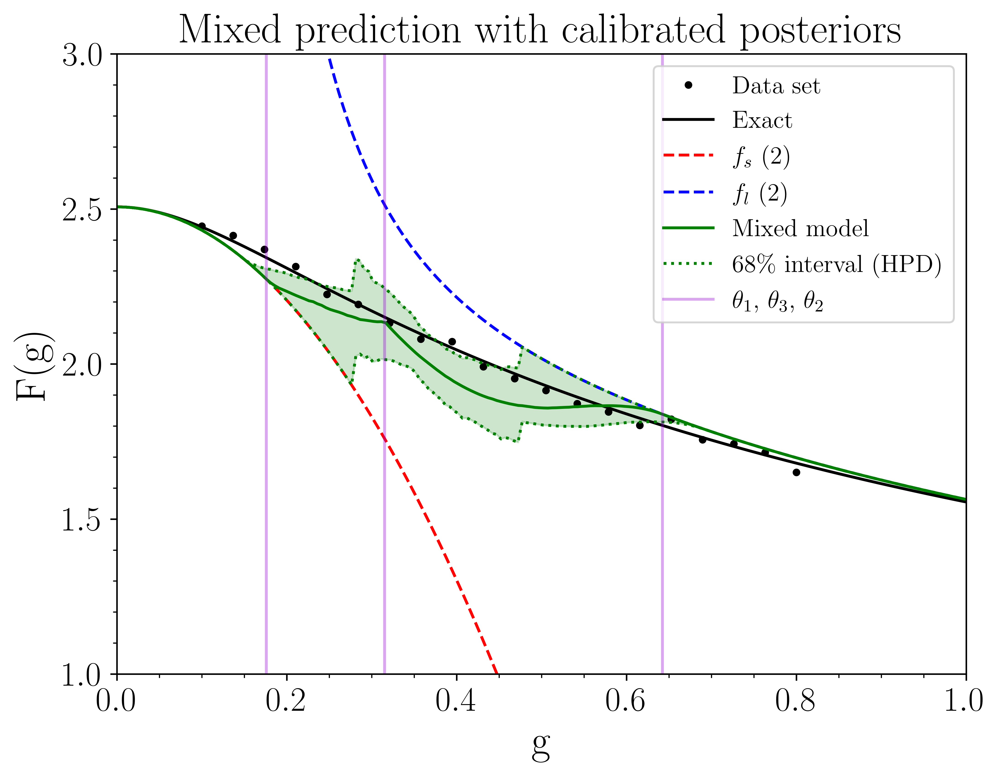

Would you like to save the plot to a file (yes/no)?yes
Enter a file name to use (include file type as .png, .pdf, etc.).lmm_plot_2v2.png


In [9]:
one.plot_ppd(median_results, g_data1, g1, g_ppd, data, switch_med_results, switch_g_intervals, 68, low1, high1)

### 5 and 23

Prior information needed to reproduce figure in the paper:

#g1 truncated between (0, 0.35)
g1 = self.luniform(params[0], 0.1, 0.3) + stats.norm.logpdf(params[0], 0.08, 0.05)

#g3 truncated between (g1, 0.35)
g3 = self.luniform(params[2], params[0], 0.3) + stats.norm.logpdf(params[2], 0.12, 0.05)

#g2 truncated between (g3, 0.35)
g2 = self.luniform(params[1], params[2], 0.3) + stats.norm.logpdf(params[1], 0.14, 0.05)

Welcome to the BMM sandbox! Here you get to play!
Set a dpi for the figure.600

y-limits (enter "auto" if unknown): 1.8,2.6


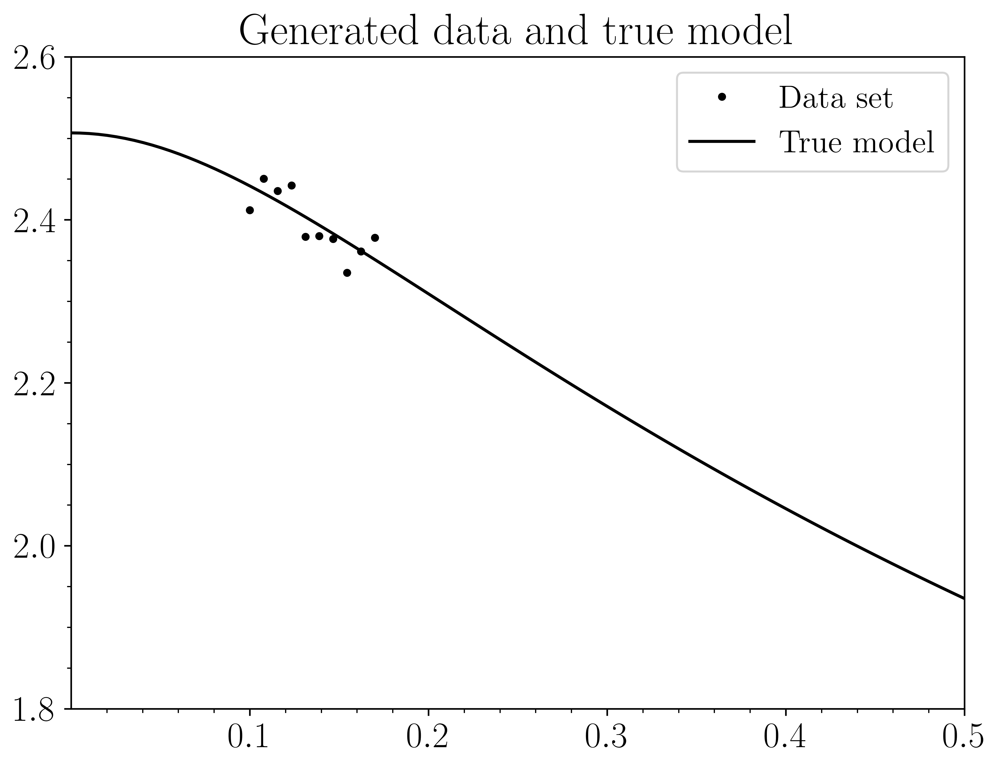

Would you like to save this figure? (yes/no)no


In [7]:
#set up the arrays
g = np.linspace(1e-6, 0.5, 100)
low1 = np.array([5])
high1 = np.array([23])

#set up the class
one1 = Mixing()

#generate some data
g_data2 = np.linspace(0.1, 0.17, 10)

data = np.array([2.41176533, 2.45038823, 2.4353146 , 2.44206432, 2.37922158,
        2.38020006, 2.37649185, 2.33495838, 2.36115533, 2.37805535])
sigma = np.array([0.02411765, 0.02450388, 0.02435315, 0.02442064, 0.02379222,
        0.023802  , 0.02376492, 0.02334958, 0.02361155, 0.02378055])

data, sigma = one1.add_data(g, g_data2, data, sigma)

In [8]:
#call the function for LMM sampling
chainr, trace = one1.mixed_model(g_data2, data, sigma, low1, high1)

What switching function would you like to use: logistic, cdf, or cosine?cosine
Enter the number of steps per walker.3000
Using 20 walkers with 3000 steps each, for a total of 60000 samples.
[[0.13067739 0.28873464 0.2399286 ]
 [0.16022447 0.27536722 0.22281055]
 [0.17754396 0.29606722 0.19419836]
 [0.16533368 0.25850689 0.21381079]
 [0.12893428 0.29185552 0.23330962]
 [0.12676761 0.28029461 0.22647123]
 [0.16884833 0.27023451 0.1940225 ]
 [0.15368292 0.26836131 0.19972229]
 [0.130866   0.27243005 0.20980037]
 [0.12102225 0.25457384 0.23770309]
 [0.14268321 0.28424644 0.21268673]
 [0.17936374 0.25455085 0.2355326 ]
 [0.15421929 0.25752517 0.22383901]
 [0.15029193 0.26167034 0.21933688]
 [0.17691769 0.26612767 0.23849185]
 [0.12804774 0.28416699 0.23150854]
 [0.1649634  0.28989392 0.22414985]
 [0.14324816 0.29033802 0.22166073]
 [0.12025305 0.26159385 0.20042949]
 [0.13891802 0.27291112 0.20130045]] (20, 3)
Calculation finished!
Duration = 2 min, 13 sec.
How many burn-in samples per walk

The autocorrelation information is: p = [ 30.19321527 -28.75037159]; cov = [[ 0.06429715 -0.07080744]
 [-0.07080744  0.07855845]]
The autocorrelation information is: p = [ 36.51752974 -32.38801716]; cov = [[ 0.11384449 -0.11499949]
 [-0.11499949  0.11687004]]
The autocorrelation information is: p = [ 25.81087521 -25.49199881]; cov = [[ 0.0049314  -0.00573024]
 [-0.00573024  0.00671955]]
The autocorrelation time is: 30.193215270842757
The autocorrelation time is: 36.51752973791717
The autocorrelation time is: 25.810875208360127
(3, 1667)
Set a dpi for the figure.600
Do you want to display the median with the mean? (yes/no)yes


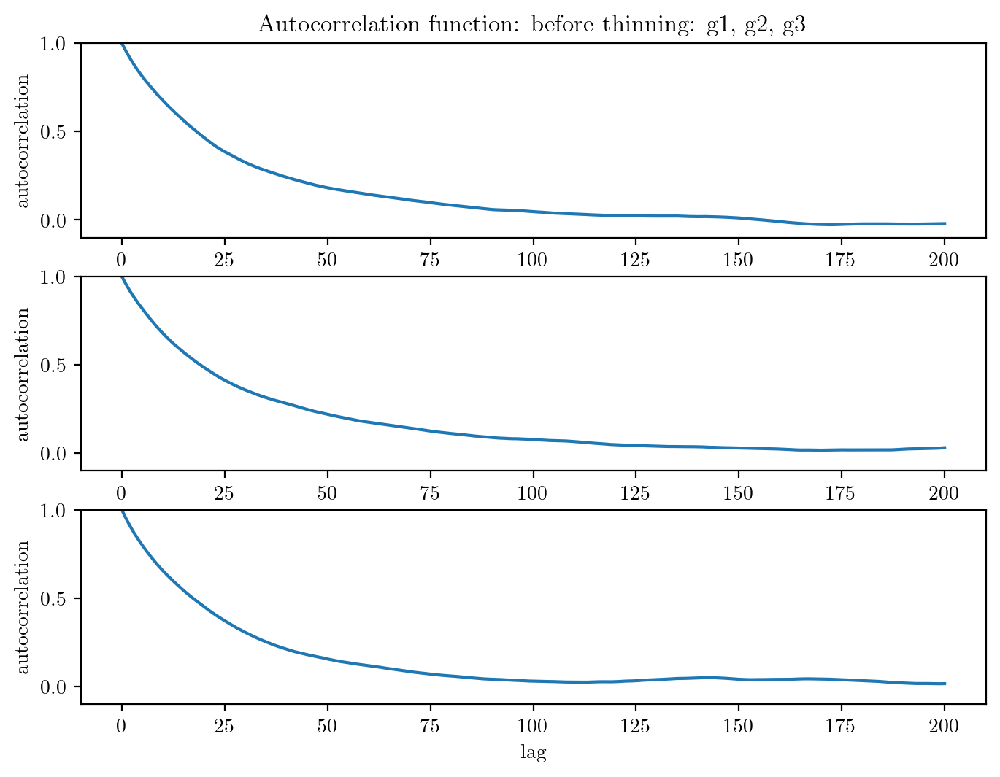

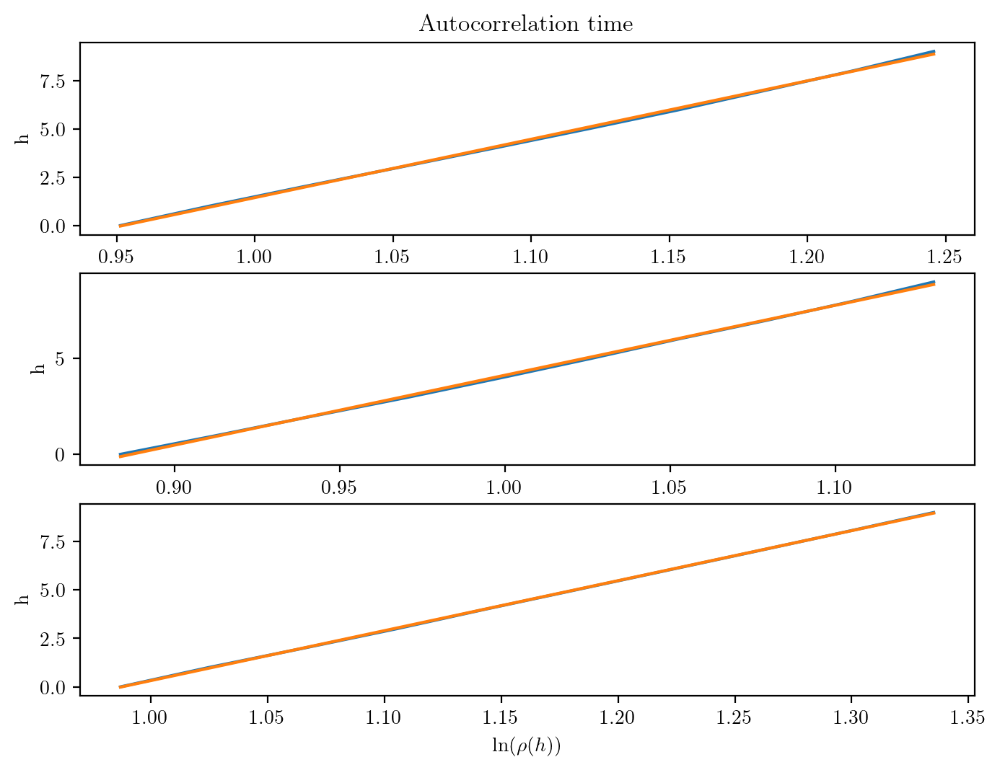

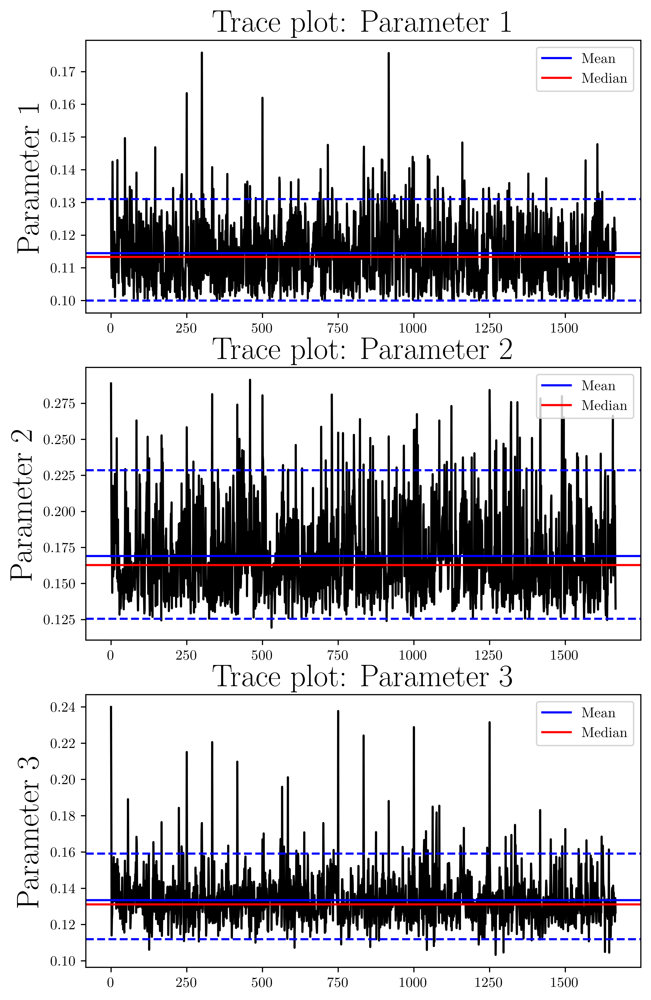

Would you like to save this figure? (yes/no)no
The median values are: 1 = 0.11336103691440172; 2 = 0.16276404898003674; 3 = 0.1311790128617433
The mean values are: 1 = 0.11452832358947619; 2 = 0.16904472802991752; 3 = 0.133479313076818


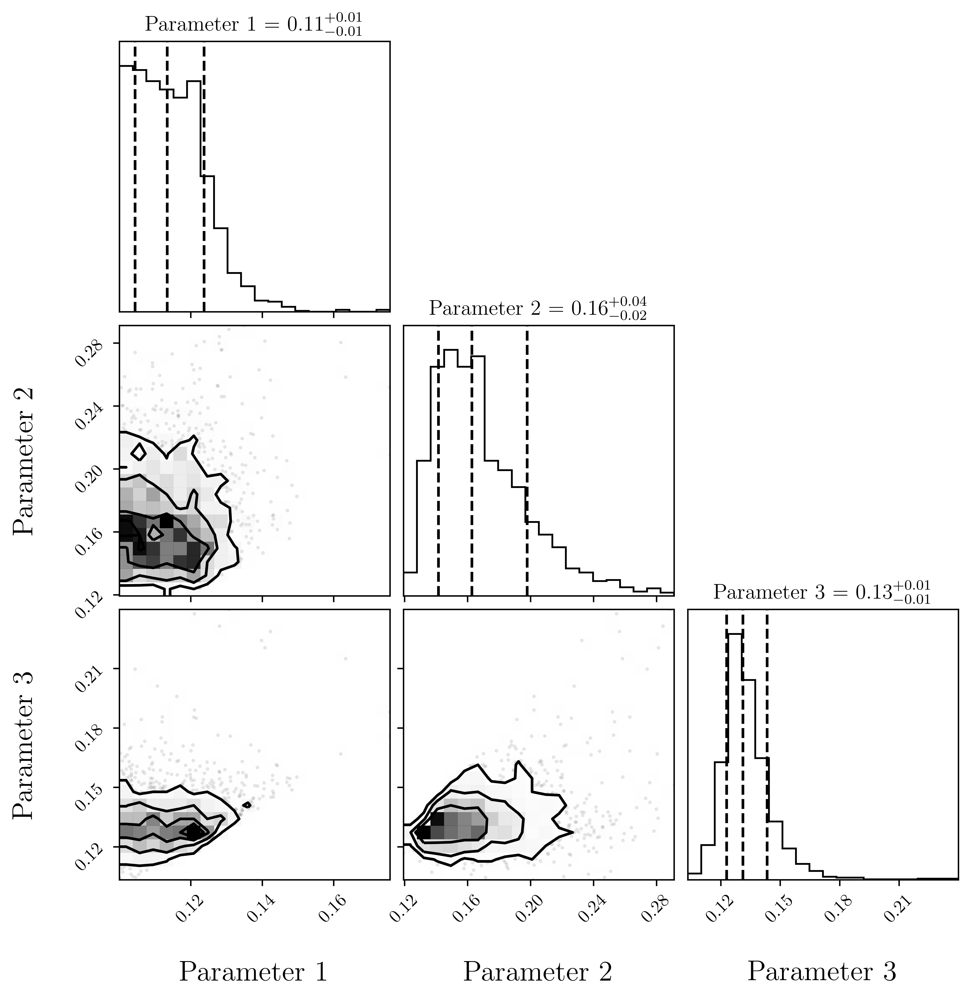

In [9]:
#find autocorrelation time and thin burn-in
def autocorrelation(chain, max_lag=100):
    dimension = len(chain)
    acors = np.empty(max_lag+1)
    if max_lag > len(chain)/5:
        warnings.warn('max_lag is more than one fifth the chain length')
    # Create a copy of the chain with average zero
    chain1d = chain - np.average(chain)
    for lag in range(max_lag+1):
        unshifted = None
        shifted = chain1d[lag:]
        if 0 == lag:
            unshifted = chain1d
        else:
            unshifted = chain1d[:-lag]
        normalization = np.sqrt(np.dot(unshifted, unshifted))
        normalization *= np.sqrt(np.dot(shifted, shifted))
        acors[lag] = np.dot(unshifted, shifted) / normalization
    return acors

#make an array of the chain results for each parameter
chain_result = chainr.chain[:,:,:]

chain1 = chain_result[:,:,0]
chain2 = chain_result[:,:,1]
chain3 = chain_result[:,:,2]

#flatten into a 1d arrays
flat1 = chain1.flatten()
flat2 = chain2.flatten()
flat3 = chain3.flatten()

#determine autocorrelation of each parameter chain
post_acors1 = autocorrelation(flat1, max_lag=200)
post_acors2 = autocorrelation(flat2, max_lag=200)
post_acors3 = autocorrelation(flat3, max_lag=200)

fig, ax = plt.subplots(3,1, figsize=(8,6), dpi=200)
ax[0].plot(post_acors1)
ax[1].plot(post_acors2)
ax[2].plot(post_acors3)
for i in range(3):
    ax[i].set(xlabel='lag', ylabel='autocorrelation', ylim=(-.1, 1));
ax[0].set_title(f'Autocorrelation function: before thinning: g1, g2, g3')

#determine the autocorrelation time
post_rho1 = post_acors1[25:35]
post_rho2 = post_acors2[25:35]
post_rho3 = post_acors3[25:35]

fig,ax = plt.subplots(3,1, figsize=(8,6), dpi=200)
post_y = np.arange(10)
post_x1 = -np.log(post_rho1)
post_x2 = -np.log(post_rho2)
post_x3 = -np.log(post_rho3)
        
ax[2].set_xlabel(r'ln($\rho(h)$)')
for i in range(3):
    ax[i].set_ylabel('h')
ax[0].set_title('Autocorrelation time')
ax[0].plot(post_x1, post_y)
ax[1].plot(post_x2, post_y)
ax[2].plot(post_x3, post_y)

#linear fits
p1, cov1 = np.polyfit(post_x1, post_y, 1, cov = True)
p2, cov2 = np.polyfit(post_x2, post_y, 1, cov=True)
p3, cov3 = np.polyfit(post_x3, post_y, 1, cov=True)

print('The autocorrelation information is: p = {}; cov = {}'.format(p1, cov1))
print('The autocorrelation information is: p = {}; cov = {}'.format(p2, cov2))
print('The autocorrelation information is: p = {}; cov = {}'.format(p3, cov3))

print('The autocorrelation time is: {}'.format(p1[0]))
print('The autocorrelation time is: {}'.format(p2[0]))
print('The autocorrelation time is: {}'.format(p3[0]))

ax[0].plot(post_x1, p1[0]*post_x1 + p1[1])
ax[1].plot(post_x2, p2[0]*post_x2 + p2[1])
ax[2].plot(post_x3, p3[0]*post_x3 + p3[1])

#adjust the samples by thinning according to the autocorrelation time
thin1 = []
thin2 = []
thin3 = []

#get the autocorrelation time we use for all 3 parameters
if p1[0] > p2[0]:
    time = p1[0]
else:
    time = p2[0]
    if p3[0] > time:
        time = p3[0]
time = int(time)
        
for i in range(len(flat2)):
    if i % time == 0:
        thin1.append(flat1[i])
        thin2.append(flat2[i])
        thin3.append(flat3[i])
                    
#array thinned samples
thin1 = np.array(thin1)
thin2 = np.array(thin2)
thin3 = np.array(thin3)

#stack traces back together
thin = np.vstack((thin1, thin2, thin3))

#reposition (transpose)
print(np.shape(thin))

one1.stats_trace(thin, 3)

#median calculation
median_1 = statistics.median(thin[0,:])
median_2 = statistics.median(thin[1,:])
median_3 = statistics.median(thin[2,:])

#mean calculation
mean_1 = np.mean(thin[0,:])
mean_2 = np.mean(thin[1,:])
mean_3 = np.mean(thin[2,:])

#arrays
mean_results = np.array([mean_1, mean_2, mean_3])
median_results = np.array([median_1, median_2, median_3])

print('The median values are: 1 = {}; 2 = {}; 3 = {}'.format(median_1, median_2, median_3))
print('The mean values are: 1 = {}; 2 = {}; 3 = {}'.format(mean_1, mean_2, mean_3))

In [10]:
g_ppd = np.linspace(1e-6, 0.5, 100)

switch_results_ppd = one1.ppd(thin, g_ppd, low1, high1)

switch_med_results = np.empty([len(g_ppd)])
switch_mode_results = np.empty([len(g_ppd)])
switch_g_intervals = np.empty([len(g_ppd), 2])

for i in range(len(g_ppd)):
    switch_med_results[i] = statistics.median(switch_results_ppd[i,:])
    switch_mode_results[i] = np.max(switch_results_ppd[i,:])
    switch_g_intervals[i, :] = one1.credible_intervals(switch_results_ppd[i,:], 0.68)

Set a dpi for the figure.600
Enter the minimum g to plot.0.0
Enter the maximum g to plot.0.4
Enter the minimum for F(g).2.2
Enter the maximum for F(g).2.5


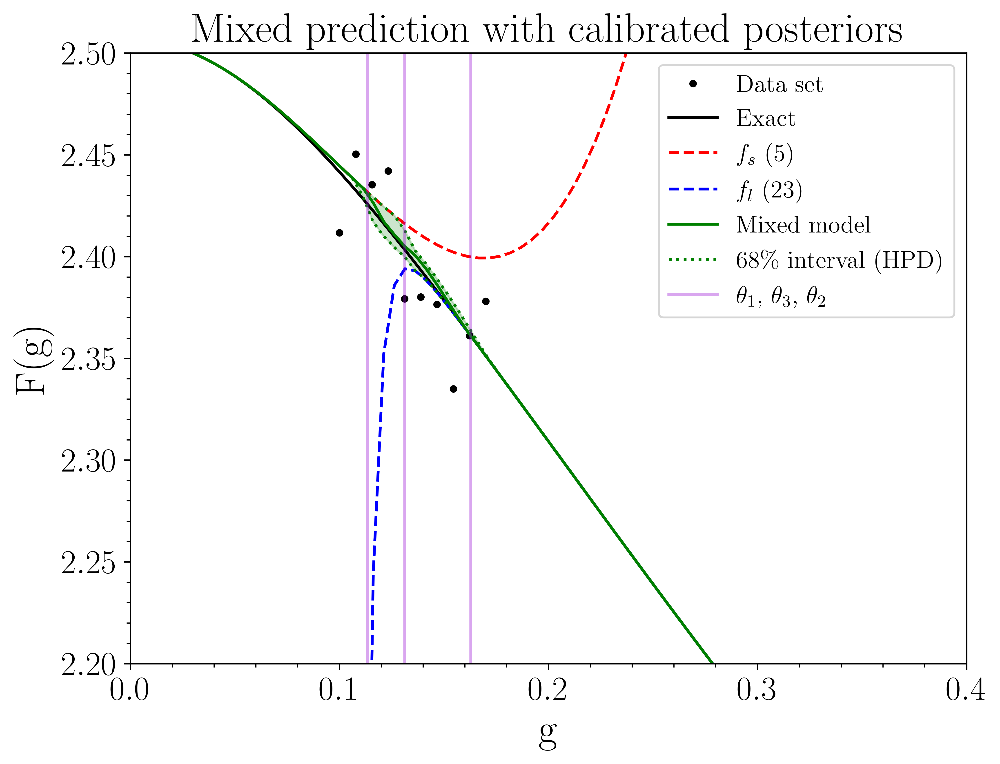

Would you like to save the plot to a file (yes/no)?yes
Enter a file name to use (include file type as .png, .pdf, etc.).lmm_plot_5v23.png


In [12]:
one1.plot_ppd(median_results, g_data2, g, g_ppd, data, switch_med_results, switch_g_intervals, 68, low1, high1)

### 5 and 10 

Welcome to the BMM sandbox! Here you get to play!
Set a dpi for the figure.600

y-limits (enter "auto" if unknown): 1.8,2.6


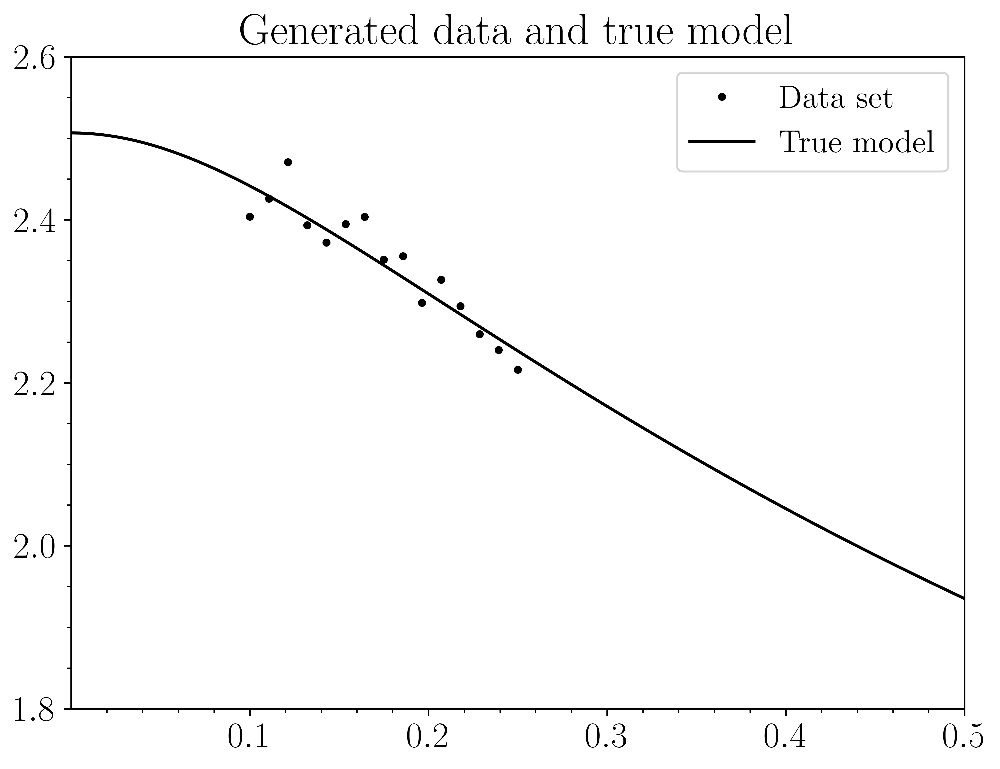

Would you like to save this figure? (yes/no)no


In [2]:
#set up the arrays
g = np.linspace(1e-6, 0.5, 100)
low1 = np.array([5])
high1 = np.array([10])

#set up the class
one2 = Mixing()

#generate some data
g_data3 = np.linspace(0.1, 0.25, 15)

data = np.array([2.4037854 , 2.42595776, 2.47074932, 2.393441  , 2.37221799,
        2.39473413, 2.40363216, 2.35134077, 2.35534449, 2.29815046,
        2.32663631, 2.29427792, 2.25979479, 2.24014106, 2.21626798])

sigma = np.array([0.02403785, 0.02425958, 0.02470749, 0.02393441, 0.02372218,
        0.02394734, 0.02403632, 0.02351341, 0.02355344, 0.0229815 ,
        0.02326636, 0.02294278, 0.02259795, 0.02240141, 0.02216268])

data, sigma = one2.add_data(g, g_data3, data, sigma)

In [3]:
#call the function for LMM sampling
chainr, trace = one2.mixed_model(g_data3, data, sigma, low1, high1)

What switching function would you like to use: logistic, cdf, or cosine?cosine
Enter the number of steps per walker.3000
Using 20 walkers with 3000 steps each, for a total of 60000 samples.
[[0.17711464 0.27318604 0.23924879]
 [0.13550174 0.29711149 0.20884625]
 [0.13890007 0.25677969 0.19122903]
 [0.14181831 0.28654856 0.20707617]
 [0.12150403 0.28423954 0.20740114]
 [0.13064229 0.27373795 0.1907751 ]
 [0.13372283 0.2835549  0.20223655]
 [0.15362839 0.27817907 0.21483883]
 [0.1746233  0.25636772 0.21612371]
 [0.16648319 0.26697433 0.20682139]
 [0.1247101  0.26647594 0.23213707]
 [0.1771864  0.26992616 0.21723581]
 [0.14269216 0.29137591 0.2269898 ]
 [0.15399873 0.26824566 0.21836477]
 [0.17980081 0.26251539 0.19313515]
 [0.13360105 0.27318857 0.223444  ]
 [0.12641555 0.29657726 0.21155345]
 [0.12215701 0.29147228 0.2193594 ]
 [0.13163289 0.28326542 0.21092378]
 [0.16687872 0.29601804 0.19065592]] (20, 3)
Calculation finished!
Duration = 2 min, 12 sec.
How many burn-in samples per walk

The autocorrelation information is: p = [ 28.42243301 -25.88029885]; cov = [[ 0.05750624 -0.06146753]
 [-0.06146753  0.06628864]]
The autocorrelation information is: p = [ 29.94017936 -27.17822211]; cov = [[ 0.0188739  -0.01996954]
 [-0.01996954  0.02130245]]
The autocorrelation information is: p = [ 24.59895534 -25.26160263]; cov = [[ 0.01419092 -0.01716921]
 [-0.01716921  0.020966  ]]
The autocorrelation time is: 28.422433013691318
The autocorrelation time is: 29.940179362815474
The autocorrelation time is: 24.598955340512724
(3, 2069)
Set a dpi for the figure.600
Do you want to display the median with the mean? (yes/no)yes


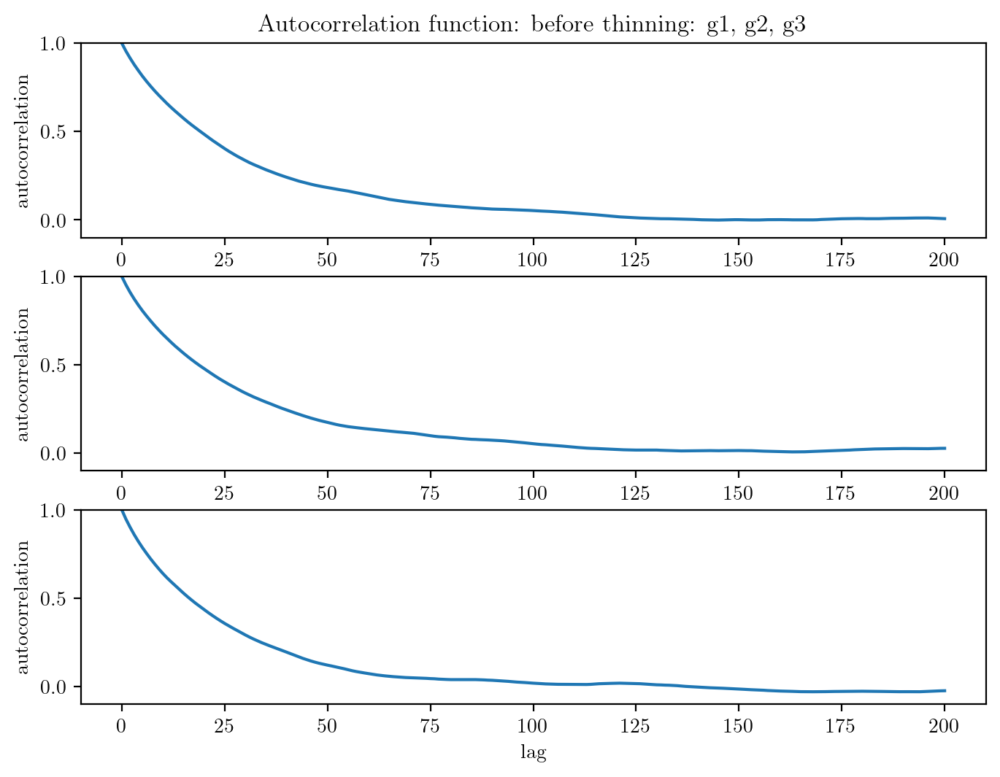

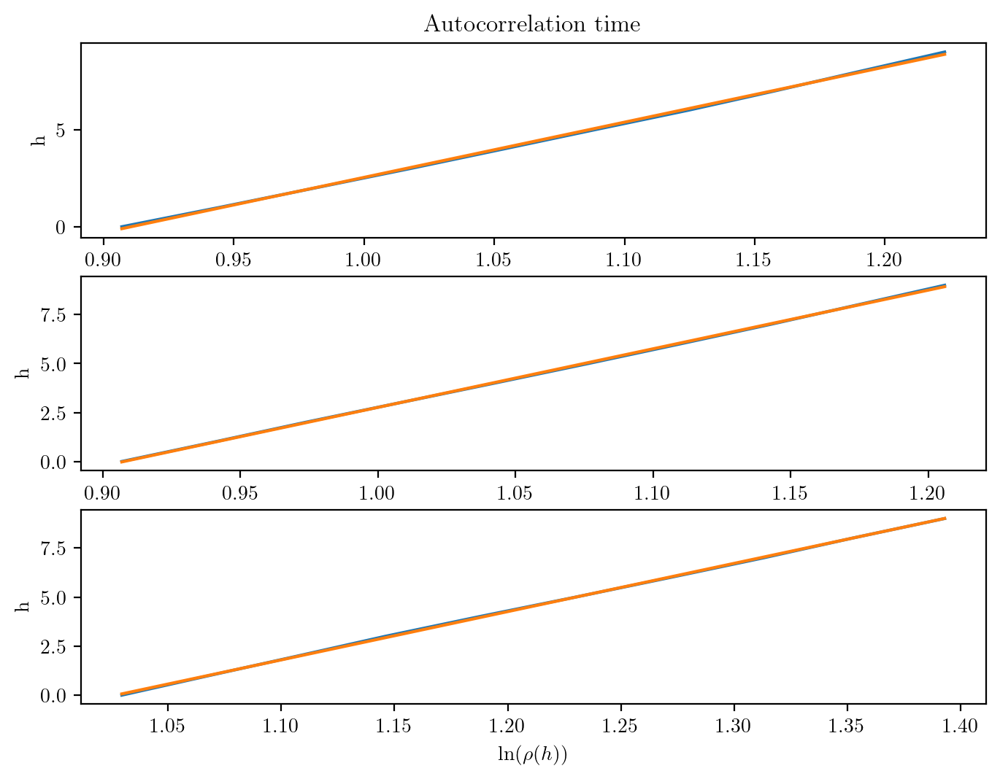

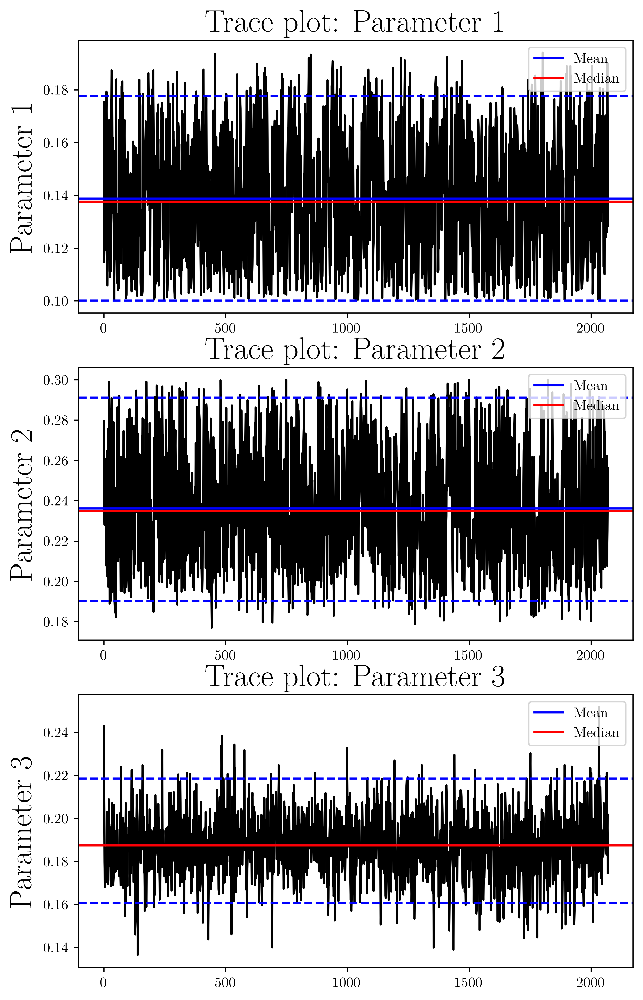

Would you like to save this figure? (yes/no)no
The median values are: 1 = 0.1376505500952987; 2 = 0.23493900251290725; 3 = 0.1874677808907167
The mean values are: 1 = 0.13880351175473246; 2 = 0.23624813931801336; 3 = 0.1875261351319071


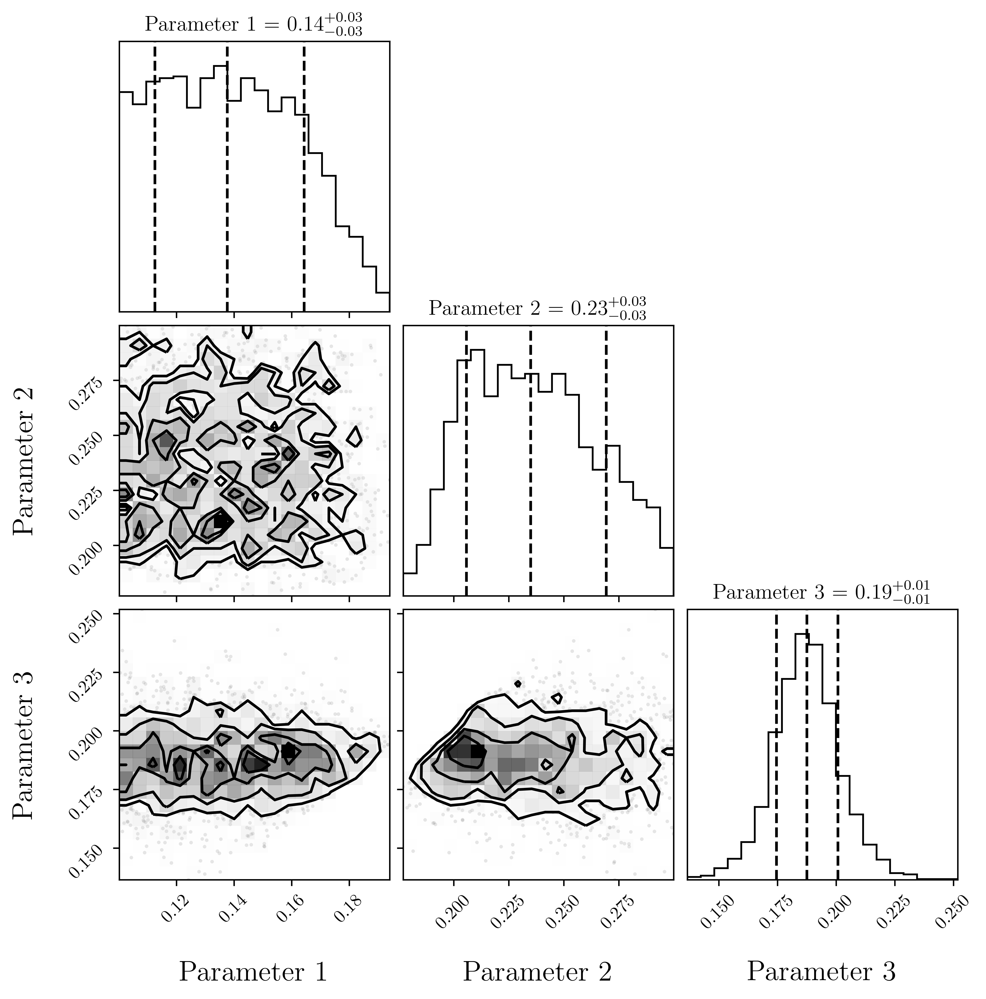

In [4]:
#find autocorrelation time and thin burn-in
def autocorrelation(chain, max_lag=100):
    dimension = len(chain)
    acors = np.empty(max_lag+1)
    if max_lag > len(chain)/5:
        warnings.warn('max_lag is more than one fifth the chain length')
    # Create a copy of the chain with average zero
    chain1d = chain - np.average(chain)
    for lag in range(max_lag+1):
        unshifted = None
        shifted = chain1d[lag:]
        if 0 == lag:
            unshifted = chain1d
        else:
            unshifted = chain1d[:-lag]
        normalization = np.sqrt(np.dot(unshifted, unshifted))
        normalization *= np.sqrt(np.dot(shifted, shifted))
        acors[lag] = np.dot(unshifted, shifted) / normalization
    return acors

#make an array of the chain results for each parameter
chain_result = chainr.chain[:,:,:]

chain1 = chain_result[:,:,0]
chain2 = chain_result[:,:,1]
chain3 = chain_result[:,:,2]

#flatten into a 1d arrays
flat1 = chain1.flatten()
flat2 = chain2.flatten()
flat3 = chain3.flatten()

#determine autocorrelation of each parameter chain
post_acors1 = autocorrelation(flat1, max_lag=200)
post_acors2 = autocorrelation(flat2, max_lag=200)
post_acors3 = autocorrelation(flat3, max_lag=200)

fig, ax = plt.subplots(3,1, figsize=(8,6), dpi=200)
ax[0].plot(post_acors1)
ax[1].plot(post_acors2)
ax[2].plot(post_acors3)
for i in range(3):
    ax[i].set(xlabel='lag', ylabel='autocorrelation', ylim=(-.1, 1));
ax[0].set_title(f'Autocorrelation function: before thinning: g1, g2, g3')

#determine the autocorrelation time
post_rho1 = post_acors1[25:35]
post_rho2 = post_acors2[25:35]
post_rho3 = post_acors3[25:35]

fig,ax = plt.subplots(3,1, figsize=(8,6), dpi=200)
post_y = np.arange(10)
post_x1 = -np.log(post_rho1)
post_x2 = -np.log(post_rho2)
post_x3 = -np.log(post_rho3)
        
ax[2].set_xlabel(r'ln($\rho(h)$)')
for i in range(3):
    ax[i].set_ylabel('h')
ax[0].set_title('Autocorrelation time')
ax[0].plot(post_x1, post_y)
ax[1].plot(post_x2, post_y)
ax[2].plot(post_x3, post_y)

#linear fits
p1, cov1 = np.polyfit(post_x1, post_y, 1, cov = True)
p2, cov2 = np.polyfit(post_x2, post_y, 1, cov=True)
p3, cov3 = np.polyfit(post_x3, post_y, 1, cov=True)

print('The autocorrelation information is: p = {}; cov = {}'.format(p1, cov1))
print('The autocorrelation information is: p = {}; cov = {}'.format(p2, cov2))
print('The autocorrelation information is: p = {}; cov = {}'.format(p3, cov3))

print('The autocorrelation time is: {}'.format(p1[0]))
print('The autocorrelation time is: {}'.format(p2[0]))
print('The autocorrelation time is: {}'.format(p3[0]))

ax[0].plot(post_x1, p1[0]*post_x1 + p1[1])
ax[1].plot(post_x2, p2[0]*post_x2 + p2[1])
ax[2].plot(post_x3, p3[0]*post_x3 + p3[1])

#adjust the samples by thinning according to the autocorrelation time
thin1 = []
thin2 = []
thin3 = []

#get the autocorrelation time we use for all 3 parameters
if p1[0] > p2[0]:
    time = p1[0]
else:
    time = p2[0]
    if p3[0] > time:
        time = p3[0]
time = int(time)
        
for i in range(len(flat2)):
    if i % time == 0:
        thin1.append(flat1[i])
        thin2.append(flat2[i])
        thin3.append(flat3[i])
                    
#array thinned samples
thin1 = np.array(thin1)
thin2 = np.array(thin2)
thin3 = np.array(thin3)

#stack traces back together
thin = np.vstack((thin1, thin2, thin3))

#reposition (transpose)
print(np.shape(thin))

one2.stats_trace(thin, 3)

#median calculation
median_1 = statistics.median(thin[0,:])
median_2 = statistics.median(thin[1,:])
median_3 = statistics.median(thin[2,:])

#mean calculation
mean_1 = np.mean(thin[0,:])
mean_2 = np.mean(thin[1,:])
mean_3 = np.mean(thin[2,:])

#arrays
mean_results = np.array([mean_1, mean_2, mean_3])
median_results = np.array([median_1, median_2, median_3])

print('The median values are: 1 = {}; 2 = {}; 3 = {}'.format(median_1, median_2, median_3))
print('The mean values are: 1 = {}; 2 = {}; 3 = {}'.format(mean_1, mean_2, mean_3))

In [5]:
g_ppd = np.linspace(1e-6, 0.5, 100)

switch_results_ppd = one2.ppd(thin, g_ppd, low1, high1)

switch_med_results = np.empty([len(g_ppd)])
switch_mode_results = np.empty([len(g_ppd)])
switch_g_intervals = np.empty([len(g_ppd), 2])

for i in range(len(g_ppd)):
    switch_med_results[i] = statistics.median(switch_results_ppd[i,:])
    switch_mode_results[i] = np.max(switch_results_ppd[i,:])
    switch_g_intervals[i, :] = one2.credible_intervals(switch_results_ppd[i,:], 0.68)

Set a dpi for the figure.600
Enter the minimum g to plot.0.0
Enter the maximum g to plot.0.5
Enter the minimum for F(g).1.8
Enter the maximum for F(g).2.6


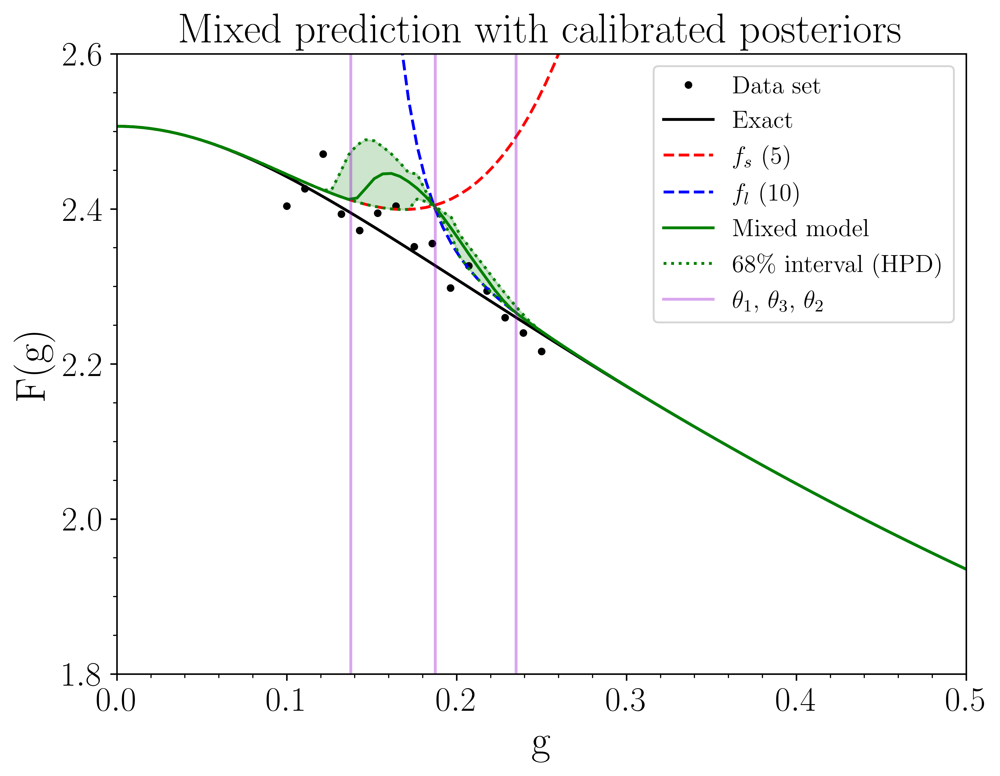

Would you like to save the plot to a file (yes/no)?yes
Enter a file name to use (include file type as .png, .pdf, etc.).lmm_plot_5v10.png


In [6]:
one2.plot_ppd(median_results, g_data3, g, g_ppd, data, switch_med_results, switch_g_intervals, 68, low1, high1)

__NOTE__: Fix bug in LMM code -> still having numpy.int32 not iterable issue!

## Bivariate localized Bayesian model mixing

### 2 and 2

Set a dpi for the figure.600

x-limits (enter "auto" if unknown): 0.0,1.0

y-limits (enter "auto" if unknown): 1.0,3.0
Which error model do you want to use, uninformative or informative?informative

Small-g expansion: error will be on the order of g^4.
[ 0.         0.        -0.4699928  0.       ]
Large-g expansion: error will be of the order g^3.
[ 1.81280495 -1.08599728  0.90640248]
Which interval do you want to use: 68 or 95?68
(1, 500)


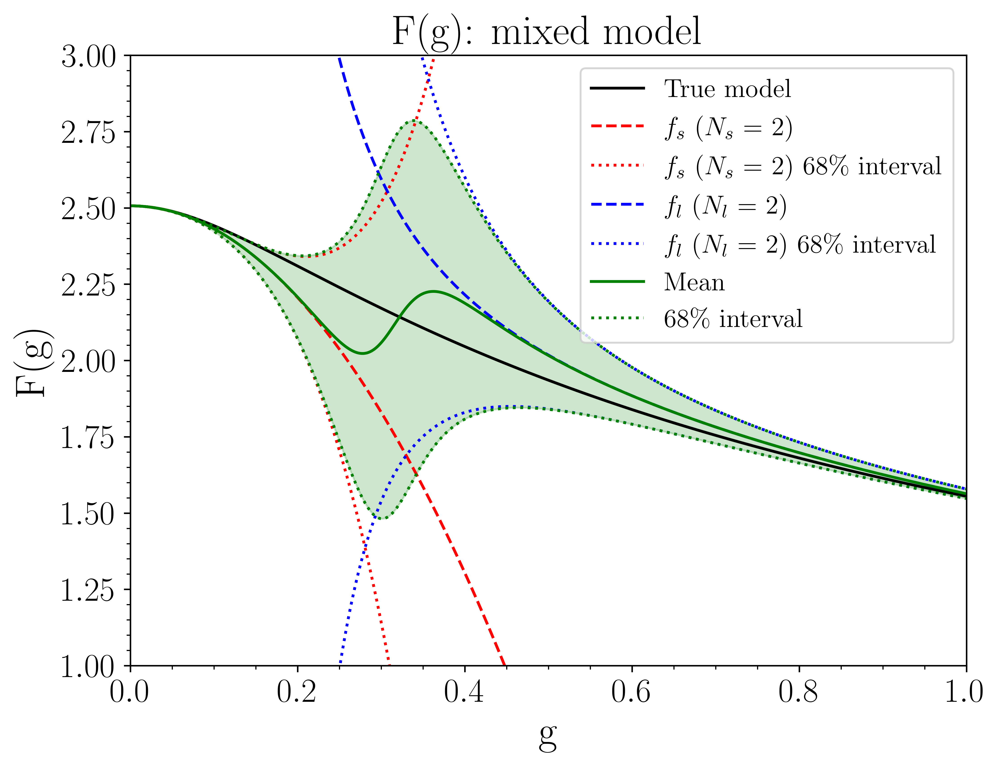

Would you like to save this figure? (yes/no)no


In [13]:
#set up the arrays
g2 = np.linspace(1e-6, 1.0, 500)
low2 = np.array([2,5])
high2 = np.array([2,5,23])

#set up the class
two = Discrepancy()

#call the proper function
two.plot_mix(g2, low2[0], high2[0], plot_fdagger=True)

### 5 and 5

Set a dpi for the figure.600

x-limits (enter "auto" if unknown): 0.0,0.8

y-limits (enter "auto" if unknown): 1.5,3.0
Which error model do you want to use, uninformative or informative?informative
Small-g expansion: error will be on the order of g^6.
[ 0.          0.         -0.4699928   0.          0.51405463  0.        ]
Large-g expansion: error will be of the order g^6.
[ 1.81280495 -1.08599728  0.90640248 -0.81449796  0.7553354  -0.71268571]
Which interval do you want to use: 68 or 95?68
(1, 500)


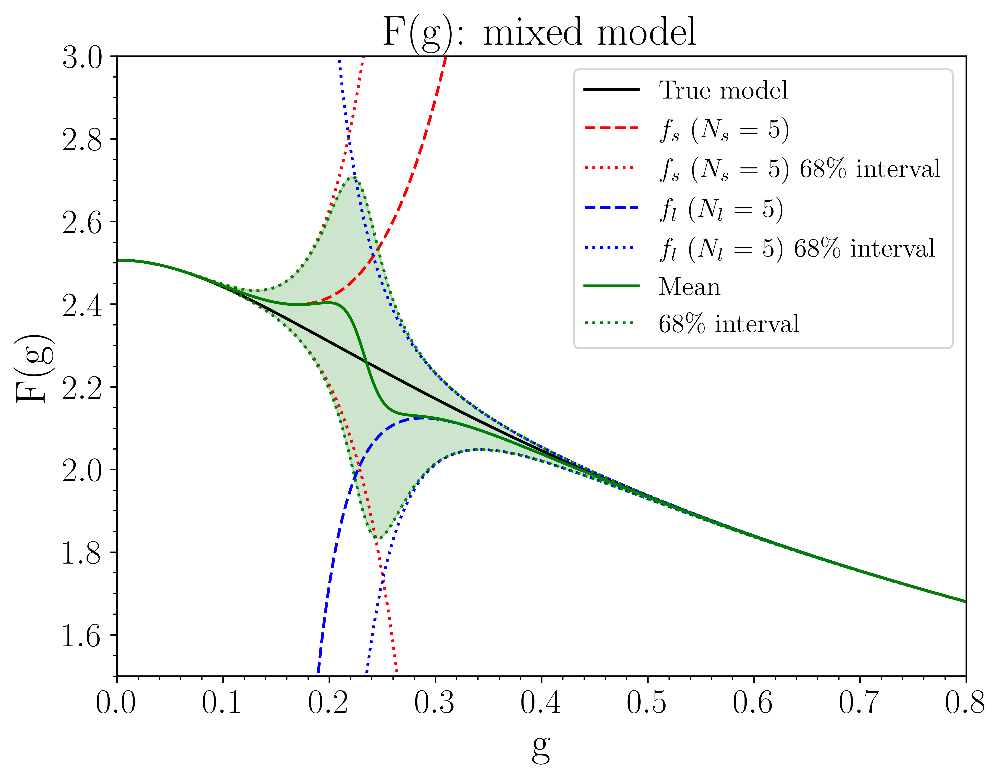

Would you like to save this figure? (yes/no)yes
Enter a file name (include .jpg, .png, etc.)bivgauss_5and5.png


In [15]:
#call again
two.plot_mix(g2, low2[1], high2[1], plot_fdagger=True)

### 5 and 23

Set a dpi for the figure.600

x-limits (enter "auto" if unknown): 0.0,0.25

y-limits (enter "auto" if unknown): 2.28,2.55
Which error model do you want to use, uninformative or informative?informative
Small-g expansion: error will be on the order of g^6.
[ 0.          0.         -0.4699928   0.          0.51405463  0.        ]
Large-g expansion: error will be of the order g^24.
[ 1.81280495 -1.08599728  0.90640248 -0.81449796  0.7553354  -0.71268571
  0.67980186 -0.65329524  0.63124458 -0.61246428  0.59617544 -0.58184107
  0.56907656 -0.55759769  0.547189   -0.53768349  0.52894936 -0.52088088
  0.51339203 -0.50641197  0.49988171 -0.49375167  0.48797977 -0.48253004]
Which interval do you want to use: 68 or 95?68
(1, 500)


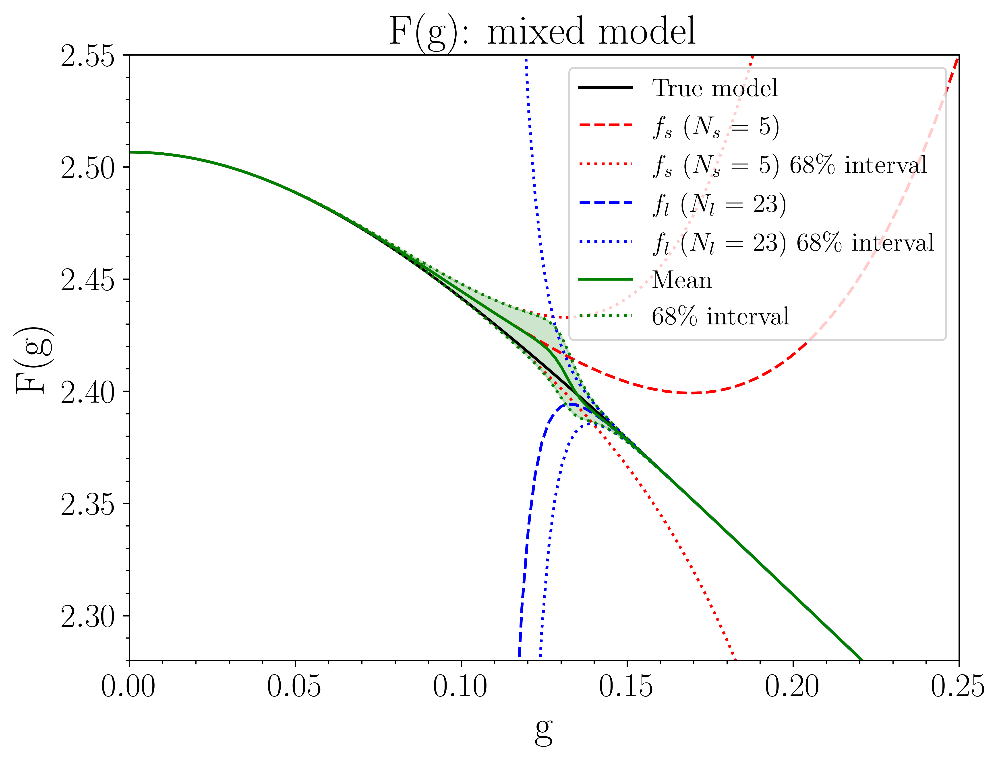

Would you like to save this figure? (yes/no)yes
Enter a file name (include .jpg, .png, etc.)bivgauss_5and23.png


In [28]:
#and call again
two.plot_mix(g2, low2[1], high2[3], plot_fdagger=True)

### 5 and 10

Set a dpi for the figure.600

x-limits (enter "auto" if unknown): 0.0,0.5

y-limits (enter "auto" if unknown): 2.0,2.6
Which error model do you want to use, uninformative or informative?informative
Small-g expansion: error will be on the order of g^6.
[ 0.          0.         -0.4699928   0.          0.51405463  0.        ]
Large-g expansion: error will be of the order g^11.
[ 1.81280495 -1.08599728  0.90640248 -0.81449796  0.7553354  -0.71268571
  0.67980186 -0.65329524  0.63124458 -0.61246428  0.59617544]
Which interval do you want to use: 68 or 95?68
(1, 500)


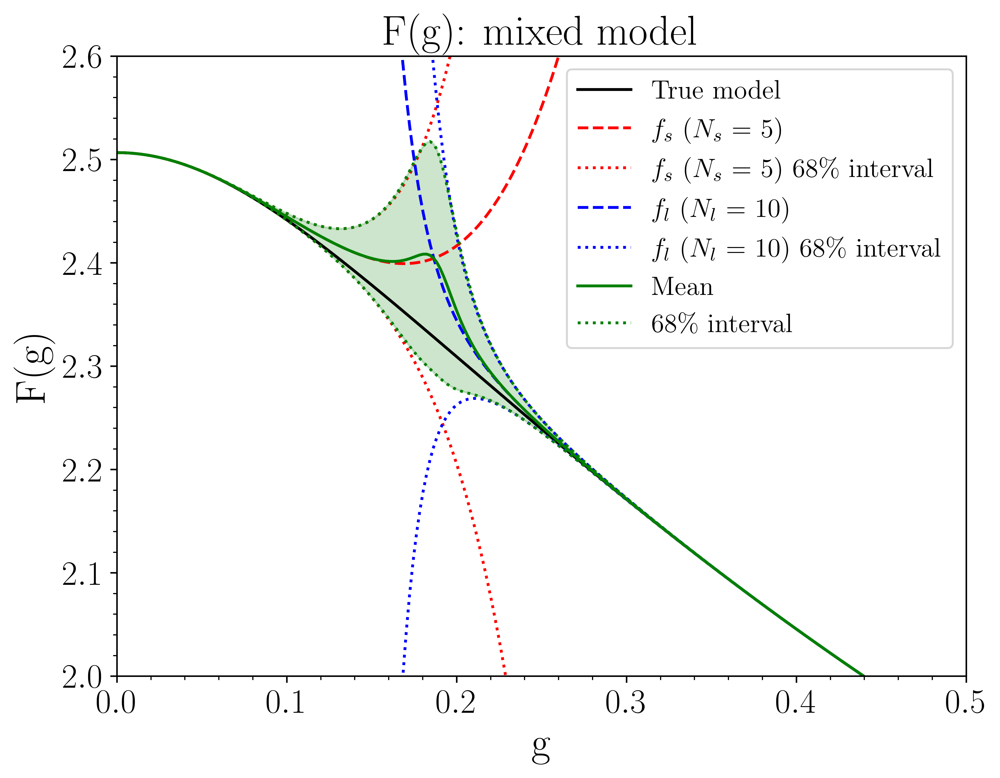

Would you like to save this figure? (yes/no)yes
Enter a file name (include .jpg, .png, etc.)bivgauss5and10.png


In [31]:
two.plot_mix(g2, low2[1], np.array([10]), plot_fdagger=True)

## Multivariate localized Bayesian model mixing with Gaussian processes

## Comparison plots